# **Mô tả vấn đề**

## **1. Thiết lập vấn đề**


# **2. Cách thực hiện**
Mô tả này đi qua việc thực hiên một bộ giải cho từng bước được mô tả ở trên

### *2.1. Import các thư viện cần thiết*

In [ ]:
import deepxde as dde
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Thiết lập độ chính xác
dde.config.set_default_float("float64")

# Đặt seed để tái lập
np.random.seed(1234)
tf.random.set_seed(1234)

# Định nghĩa các tham số vật lý
L_x, L_y, L_z = 1000, 1000, 100  # Kích thước vỉa (m)
A = L_y * L_z  # Diện tích mặt cắt (m²)
phi = 0.2  # Độ rỗng đồng nhất
k = 100e-15  # Độ thấm đồng nhất (m²)
v = 0.5  # Vận tốc Darcy (m/day)
M = 1.0  # Tỷ số độ nhớt (mu_o / mu_w)
mu_w = 1e-3  # Độ nhớt nước (Pa.s)
mu_o = M * mu_w  # Độ nhớt dầu (Pa.s)
Q_w_inj = 2000  # Lưu lượng bơm ép nước (m³/day)
Q_prod = 2000  # Lưu lượng khai thác (m³/day)
t_simulate = 5000  # Thời gian mô phỏng (days)
well_radius = 10  # Bán kính vùng giếng (m)

"""# Định nghĩa hàm phân đoạn nước (fractional flow)
def f_w(Sw):
    kr_w = Sw ** 2  # Độ thấm tương đối nước
    kr_o = (1 - Sw) ** 2  # Độ thấm tương đối dầu
    return kr_w / (kr_w + (kr_o / M))

# Tính Sw* và sigma cho hàm f_w_tilde
Sw_star = np.sqrt(1 / (1 + 1 / M))
sigma = f_w(Sw_star) / Sw_star

def f_w_tilde(Sw):
    Sw = tf.cast(Sw, tf.float64)
    return tf.where(Sw < Sw_star, sigma * Sw, f_w(Sw))
"""
# Định nghĩa PDE cho độ bão hòa nước
def pde(x, Sw):
    Sw = tf.cast(Sw, tf.float64)
    t = x[:, 3:4]  # thời gian
    
    # Đạo hàm thời gian của Sw
    dSw_dt = dde.grad.jacobian(Sw, x, i=0, j=3)
    
    # Gradient áp suất (hằng số)
    grad_P = tf.constant([-1 / L_x, -1 / L_y, -1 / L_z], dtype=tf.float64)
    
    # Độ thấm tương đối nước, thêm giới hạn để tránh nan
    kr_w = tf.clip_by_value(Sw ** 2, 1e-10, 1.0)
    
    # Gradient của Sw, thêm giới hạn để ổn định
    dSw_dx = dde.grad.jacobian(Sw, x, i=0, j=0)  # dSw/dx
    dSw_dy = dde.grad.jacobian(Sw, x, i=0, j=1)  # dSw/dy
    dSw_dz = dde.grad.jacobian(Sw, x, i=0, j=2)  # dSw/dz
    
    # Gradient của kr_w = 2 * Sw * grad(Sw)
    grad_Sw = tf.concat([dSw_dx, dSw_dy, dSw_dz], axis=1)
    grad_kr_w = 2 * tf.clip_by_value(Sw, 1e-10, 1.0) * grad_Sw
    
    # Divergence của q_w = -k / mu_w * (grad_kr_w . grad_P)
    div_q_w = -k / mu_w * tf.reduce_sum(grad_kr_w * grad_P, axis=1, keepdims=True)
    
    # Phương trình bảo toàn khối lượng cho nước
    return phi * dSw_dt + div_q_w

# Định nghĩa miền không gian-thời gian 3D
geom = dde.geometry.Cuboid([0, 0, 0], [L_x, L_y, L_z])
timedomain = dde.geometry.TimeDomain(0, t_simulate)
geomtime = dde.geometry.GeometryXTime(geom, timedomain)

# Điều kiện biên
# Define initial condition: Sw(x, y, z, 0) = 0
def initial_condition(x):
    return tf.zeros_like(x[:, 0:1], dtype=tf.float64)

ic = dde.icbc.IC(geomtime, initial_condition, lambda x, on_initial: on_initial)

# Define boundary condition for injection well along z-axis at (x,y) = (0,0)
def injection_well_condition(x, on_boundary):
    return (on_boundary and 
            np.isclose(x[0], 0, atol=5) and np.isclose(x[1], 0, atol=50))

bc_injection = dde.icbc.DirichletBC(
    geomtime, 
    lambda x: np.ones_like(x[:, 0:1]), 
    injection_well_condition
)

# Define boundary condition for production well at (L_x, L_y / 2)
def production_well_condition(x, on_boundary):
    return on_boundary and np.isclose(x[0], L_x) and np.isclose(x[1], L_y, atol=50)

bc_production = dde.icbc.DirichletBC(
    geomtime, 
    lambda x: np.zeros_like(x[:, 0:1]), 
    production_well_condition
)

# Dữ liệu huấn luyện
data = dde.data.TimePDE(
    geomtime,
    pde,
    [bc_injection, bc_production, ic],
    num_domain=10000,  # Tăng số điểm
    num_boundary=2000,  # Tăng số điểm
    num_initial=2000,   # Tăng số điểm
    num_test=10000,    # Tăng số điểm
)

# Định nghĩa mạng nơ-ron
layer_size = [4] + [128] * 6 + [1]  # Giảm kích thước mạng để tăng tốc
activation = "tanh"
initializer = "Glorot normal"
net = dde.nn.FNN(layer_size, activation, initializer)

# Ép kiểu đầu ra
def output_transform(x, y):
    Sw = tf.nn.sigmoid(y)  # Đảm bảo Sw trong [0, 1]
    return Sw

net.apply_output_transform(output_transform)

# Mô hình
model = dde.Model(data, net)

# Tối ưu hóa
model.compile("adam", lr=0.0001)

# Huấn luyện với Adam trước
losshistory, train_state = model.train(iterations=50000, display_every=10)

# Chuyển sang L-BFGS để tối ưu hóa thêm
model.compile("L-BFGS")
losshistory, train_state = model.train()


Set the default float type to float64
Compiling model...
Building feed-forward neural network...
'build' took 0.050818 s

'compile' took 0.377912 s

Training model...

0         [2.82e-08, 2.63e-01, 3.38e-01, 2.31e-01]    [2.45e-10, 2.63e-01, 3.38e-01, 2.31e-01]    []  
10        [1.36e-08, 6.58e-02, 1.50e-01, 2.32e-02]    [3.45e-10, 6.58e-02, 1.50e-01, 2.32e-02]    []  
20        [7.78e-09, 3.71e-02, 5.16e-02, 4.70e-03]    [1.53e-09, 3.71e-02, 5.16e-02, 4.70e-03]    []  
30        [7.50e-09, 1.69e-02, 1.72e-02, 1.93e-03]    [3.67e-09, 1.69e-02, 1.72e-02, 1.93e-03]    []  
40        [9.37e-09, 6.17e-03, 6.88e-03, 1.16e-03]    [5.55e-09, 6.17e-03, 6.88e-03, 1.16e-03]    []  
50        [1.09e-08, 3.12e-03, 3.93e-03, 8.43e-04]    [6.88e-09, 3.12e-03, 3.93e-03, 8.43e-04]    []  
60        [1.19e-08, 2.10e-03, 2.47e-03, 6.78e-04]    [7.92e-09, 2.10e-03, 2.47e-03, 6.78e-04]    []  
70        [1.26e-08, 1.61e-03, 1.76e-03, 5.74e-04]    [8.81e-09, 1.61e-03, 1.76e-03, 5.74e-04]    []  
80      

### *2.11. Sau khi train mạng sử dụng* **Adam**, *chúng ta sẽ tiếp tục train sử dụng* **L-BFGS** *để đạt được sai số nhỏ hơn*

### *2.12. Vẽ đồ thị kết quả và sai số*

Saving loss history to c:\Users\User\Downloads\loss.dat ...
Saving training data to c:\Users\User\Downloads\train.dat ...
Saving test data to c:\Users\User\Downloads\test.dat ...


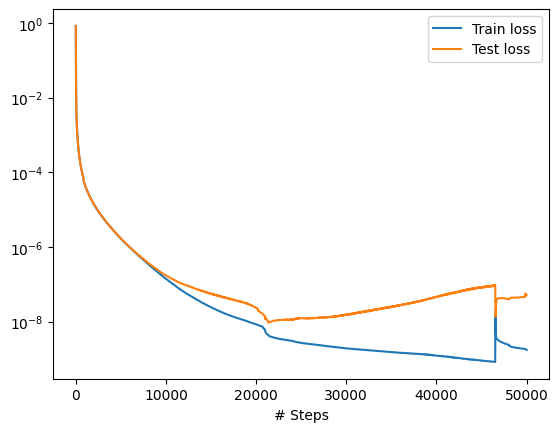

In [4]:
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

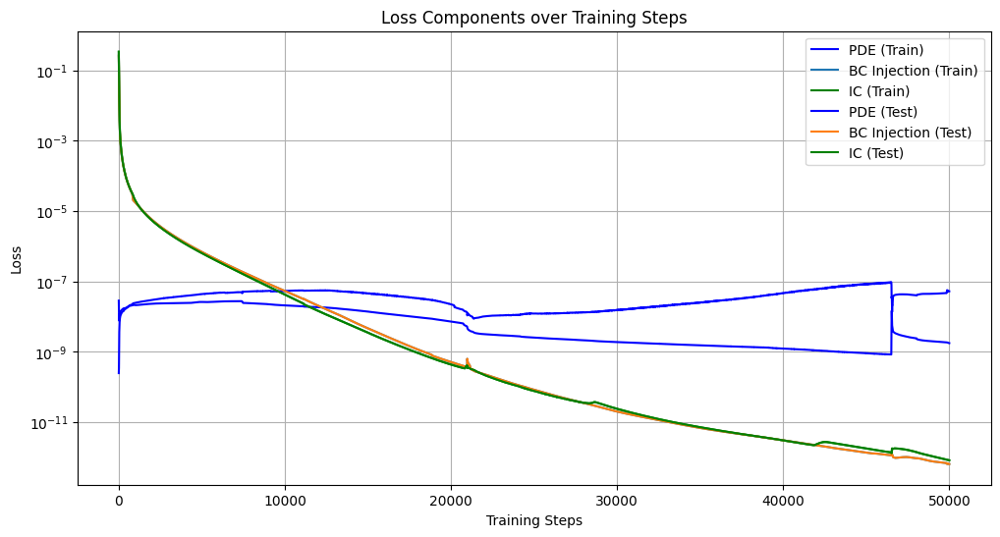

In [5]:
def visualize_loss_lines(losshistory):
    # Lấy dữ liệu từ losshistory
    steps = losshistory.steps
    train_loss = np.array(losshistory.loss_train)
    test_loss = np.array(losshistory.loss_test)

    # Tách các thành phần
    pde_train, bc_injection_train, ic_train = train_loss[:, 0], train_loss[:, 1], train_loss[:, 2]
    pde_test, bc_injection_test, ic_test = test_loss[:, 0], test_loss[:, 1], test_loss[:, 2]

    # Vẽ biểu đồ
    plt.figure(figsize=(12, 6))

    # Train loss
    plt.plot(steps, pde_train, 'b-', label='PDE (Train)')
    plt.plot(steps, bc_injection_train, label='BC Injection (Train)')
    #plt.plot(steps, bc_production_train, 'r-', label='BC Production (Train)')
    plt.plot(steps, ic_train, 'g-', label='IC (Train)')

    # Test loss
    plt.plot(steps, pde_test, 'b-', label='PDE (Test)')
    plt.plot(steps, bc_injection_test, label='BC Injection (Test)')
    #plt.plot(steps, bc_production_test, 'r-', label='BC Production (Test)')
    plt.plot(steps, ic_test, 'g-', label='IC (Test)')

    plt.xlabel('Training Steps')
    plt.ylabel('Loss')
    plt.title('Loss Components over Training Steps')
    plt.yscale('log') # Dùng thang log để thấy rõ sự giảm của loss
    plt.grid(True)
    plt.legend()
    plt.show()

# Gọi sau khi huấn luyện
visualize_loss_lines(losshistory)

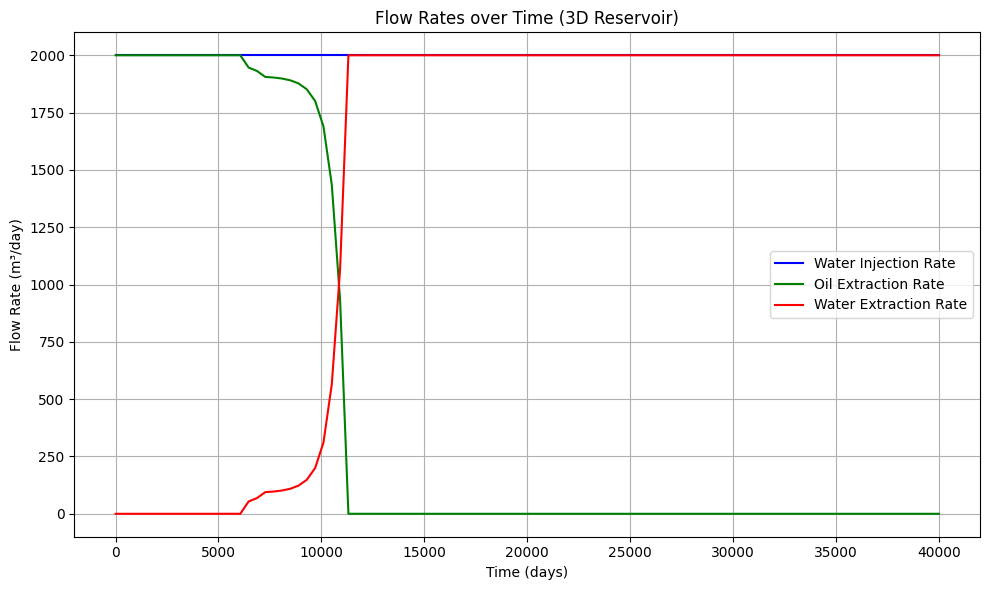

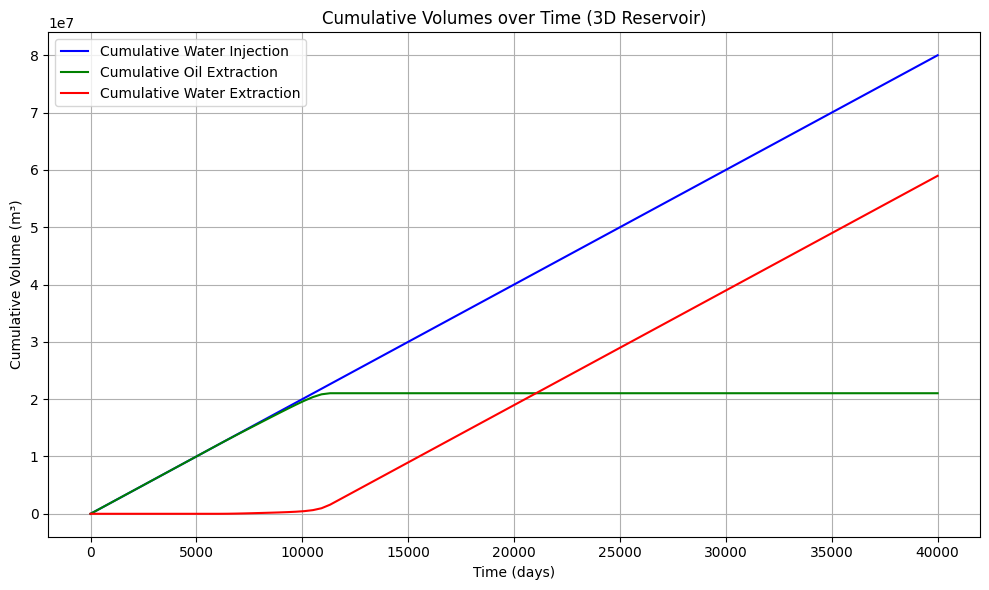

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import cumulative_trapezoid  # For numerical integration

# Modified function to include cumulative volumes for 3D reservoir
def calculate_flow_rates_and_volumes(model, time_points, production_loc=(L_x, L_y / 2, L_z / 2)):

    # Water injection rate is constant
    water_injection_rate = np.full_like(time_points, Q_w_inj)
    
    # Calculate water saturation at production well in 3D
    # Now including z-coordinate in the input points
    prod_points = np.array([[production_loc[0], production_loc[1], production_loc[2], t] 
                          for t in time_points])
    water_saturation_prod = model.predict(prod_points).flatten()
    
    # Calculate oil and water extraction rates
    oil_extraction_rate = Q_prod * (1 - water_saturation_prod)
    water_extraction_rate = Q_prod * water_saturation_prod
    
    # Calculate cumulative volumes using numerical integration (trapezoidal rule)
    water_injection_volume = cumulative_trapezoid(water_injection_rate, time_points, initial=0)
    oil_extraction_volume = cumulative_trapezoid(oil_extraction_rate, time_points, initial=0)
    water_extraction_volume = cumulative_trapezoid(water_extraction_rate, time_points, initial=0)
    
    return {
        'time': time_points,
        'water_injection_rate': water_injection_rate,
        'oil_extraction_rate': oil_extraction_rate,
        'water_extraction_rate': water_extraction_rate,
        'water_injection_volume': water_injection_volume,
        'oil_extraction_volume': oil_extraction_volume,
        'water_extraction_volume': water_extraction_volume,
        'prod_points': prod_points  # Optional: return points for debugging/verification
    }

# Function to plot cumulative volumes (unchanged)
def plot_cumulative_volumes(flow_data):
    """
    Plot cumulative volumes over time.
    
    Parameters:
    - flow_data: Dictionary with flow rates and volumes
    """
    fig, ax = plt.subplots(figsize=(10, 6))
    
    ax.plot(flow_data['time'], flow_data['water_injection_volume'], 
            label='Cumulative Water Injection', color='blue')
    ax.plot(flow_data['time'], flow_data['oil_extraction_volume'], 
            label='Cumulative Oil Extraction', color='green')
    ax.plot(flow_data['time'], flow_data['water_extraction_volume'], 
            label='Cumulative Water Extraction', color='red')
    
    ax.set_xlabel('Time (days)')
    ax.set_ylabel('Cumulative Volume (m³)')
    ax.set_title('Cumulative Volumes over Time (3D Reservoir)')
    ax.legend()
    ax.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    return fig

# Modified plot function for flow rates (unchanged visualization, updated title)
def plot_flow_rates(flow_data):
    """
    Plot flow rates over time.
    
    Parameters:
    - flow_data: Dictionary with flow rates and volumes
    """
    fig, ax = plt.subplots(figsize=(10, 6))
    
    ax.plot(flow_data['time'], flow_data['water_injection_rate'], 
            label='Water Injection Rate', color='blue')
    ax.plot(flow_data['time'], flow_data['oil_extraction_rate'], 
            label='Oil Extraction Rate', color='green')
    ax.plot(flow_data['time'], flow_data['water_extraction_rate'], 
            label='Water Extraction Rate', color='red')
    
    ax.set_xlabel('Time (days)')
    ax.set_ylabel('Flow Rate (m³/day)')
    ax.set_title('Flow Rates over Time (3D Reservoir)')
    ax.legend()
    ax.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    return fig

time_points = np.linspace(0, 40000, 100)

# Assuming 'model' is a trained DeepXDE model for 3D (x, y, z, t) inputs
# Note: You'll need to ensure your model is trained for 3D spatial dimensions
flow_data = calculate_flow_rates_and_volumes(model, time_points, production_loc=(L_x, L_y, L_z))

# Plot both flow rates and cumulative volumes
fig_flow_rates = plot_flow_rates(flow_data)
fig_cumulative_volumes = plot_cumulative_volumes(flow_data)

plt.close(fig_flow_rates)
plt.close(fig_cumulative_volumes)

Đang tạo khung hình 1/500 cho t = 0 ngày
Đang tạo khung hình 2/500 cho t = 40 ngày
Đang tạo khung hình 3/500 cho t = 80 ngày
Đang tạo khung hình 4/500 cho t = 120 ngày
Đang tạo khung hình 5/500 cho t = 160 ngày
Đang tạo khung hình 6/500 cho t = 200 ngày
Đang tạo khung hình 7/500 cho t = 240 ngày
Đang tạo khung hình 8/500 cho t = 281 ngày
Đang tạo khung hình 9/500 cho t = 321 ngày
Đang tạo khung hình 10/500 cho t = 361 ngày
Đang tạo khung hình 11/500 cho t = 401 ngày
Đang tạo khung hình 12/500 cho t = 441 ngày
Đang tạo khung hình 13/500 cho t = 481 ngày
Đang tạo khung hình 14/500 cho t = 521 ngày
Đang tạo khung hình 15/500 cho t = 561 ngày
Đang tạo khung hình 16/500 cho t = 601 ngày
Đang tạo khung hình 17/500 cho t = 641 ngày
Đang tạo khung hình 18/500 cho t = 681 ngày
Đang tạo khung hình 19/500 cho t = 721 ngày
Đang tạo khung hình 20/500 cho t = 762 ngày
Đang tạo khung hình 21/500 cho t = 802 ngày
Đang tạo khung hình 22/500 cho t = 842 ngày
Đang tạo khung hình 23/500 cho t = 882 ngày
Đ

C:\Users\User\AppData\Local\Temp\ipykernel_22080\1073494115.py:80: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame)


GIF đã được lưu dưới tên 3d_reservoir_full_sw_simulation.gif


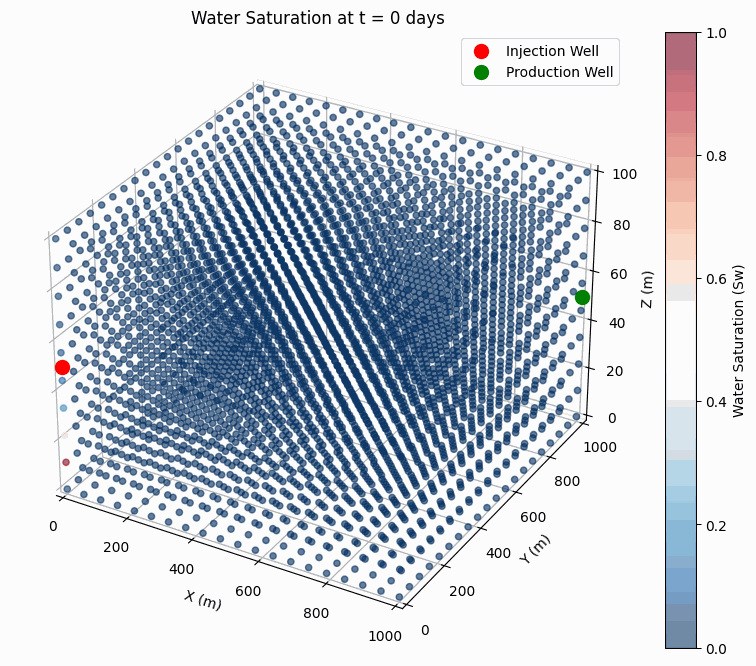

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import imageio

# Giả định rằng model và các tham số từ notebook của bạn đã được định nghĩa
# Nếu chưa, đảm bảo L_x, L_y, L_z, t_simulate, và 'model' đã được huấn luyện sẵn sàng

# Định nghĩa lưới cho bể chứa 3D (độ phân giải không gian)
nx, ny, nz = 20, 20, 10  # Độ phân giải giảm để tính toán nhanh hơn
x = np.linspace(0, L_x, nx)
y = np.linspace(0, L_y, ny)
z = np.linspace(0, L_z, nz)
X, Y, Z = np.meshgrid(x, y, z)

# Các bước thời gian cho hoạt hình
num_frames = 500
time_points = np.linspace(0, 20000, num_frames)

# Hàm dự đoán độ bão hòa nước trên lưới 3D tại một thời điểm nhất định
def get_water_saturation(model, X, Y, Z, t):
    # Chuyển lưới 3D thành danh sách các điểm với thời gian
    points = np.vstack((X.flatten(), Y.flatten(), Z.flatten(), np.full(X.size, t))).T
    Sw = model.predict(points).reshape(X.shape)
    # Giới hạn Sw trong khoảng [0, 1] để đảm bảo tính vật lý
    Sw = np.clip(Sw, 0, 1)
    return Sw

# Hàm tạo một khung hình (scatter plot 3D của toàn bộ Sw)
def create_frame(Sw, t, frame_idx):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Lấy tọa độ và giá trị Sw
    x_flat = X.flatten()
    y_flat = Y.flatten()
    z_flat = Z.flatten()
    sw_flat = Sw.flatten()
    
    # Vẽ scatter plot với màu sắc dựa trên Sw
    scatter = ax.scatter(x_flat, y_flat, z_flat, c=sw_flat, cmap='RdBu_r', 
                         vmin=0, vmax=1, s=20, alpha=0.6)
    
    # Thêm thanh màu (colorbar)
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('Water Saturation (Sw)')
    
    # Đặt nhãn và tiêu đề
    ax.set_xlabel('X (m)')
    ax.set_ylabel('Y (m)')
    ax.set_zlabel('Z (m)')
    ax.set_title(f'Water Saturation at t = {t:.0f} days')
    ax.set_xlim(0, L_x)
    ax.set_ylim(0, L_y)
    ax.set_zlim(0, L_z)
    
    # Thêm điểm đánh dấu giếng tiêm và giếng khai thác
    ax.scatter([0], [0], [L_z/2], color='red', s=100, label='Injection Well')
    ax.scatter([L_x], [L_y], [L_z/2], color='green', s=100, label='Production Well')
    ax.legend()
    
    # Lưu khung hình vào tệp tạm thời
    filename = f'frame_{frame_idx:03d}.png'
    plt.savefig(filename, dpi=100, bbox_inches='tight')
    plt.close(fig)
    return filename

# Tạo các khung hình
frames = []
for i, t in enumerate(time_points):
    print(f"Đang tạo khung hình {i+1}/{num_frames} cho t = {t:.0f} ngày")
    Sw = get_water_saturation(model, X, Y, Z, t)
    frame_file = create_frame(Sw, t, i)
    frames.append(frame_file)

# Tạo GIF
gif_filename = '3d_reservoir_full_sw_simulation.gif'
with imageio.get_writer(gif_filename, mode='I', duration=0.5) as writer:
    for frame in frames:
        image = imageio.imread(frame)
        writer.append_data(image)
        # Xóa tệp khung hình tạm thời
        import os
        os.remove(frame)

print(f"GIF đã được lưu dưới tên {gif_filename}")

# Tùy chọn: Hiển thị GIF trong Jupyter notebook (nếu áp dụng)
from IPython.display import Image
Image(filename=gif_filename)

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import imageio

# Tham số
nx, ny, nz = 20, 20, 10
x = np.linspace(0, L_x, nx)
y = np.linspace(0, L_y, ny)
z = np.linspace(0, L_z, nz)
X, Y, Z = np.meshgrid(x, y, z)
num_frames = 300
time_points = np.linspace(0, 20000, num_frames)

# Hàm tạo khung hình
def create_slice_frame(Sw, t, frame_idx, z_idx):
    fig, ax = plt.subplots(figsize=(8, 6))
    Sw_slice = Sw[:, :, z_idx]
    c = ax.contourf(X[:, :, z_idx], Y[:, :, z_idx], Sw_slice, cmap='RdBu_r', vmin=0, vmax=1)
    plt.colorbar(c, ax=ax, label='Water Saturation (Sw)')
    ax.plot([0], [0], 'ro', label='Injection Well')
    ax.plot([L_x], [L_y], 'go', label='Production Well')
    ax.legend()
    ax.set_xlabel('X (m)')
    ax.set_ylabel('Y (m)')
    ax.set_title(f'Slice at z = {z[z_idx]:.1f} m, t = {t:.0f} days')
    filename = f'slice_frame_{frame_idx:03d}.png'
    plt.savefig(filename, dpi=100, bbox_inches='tight')
    plt.close(fig)
    return filename

# Tạo các khung hình
frames = []
z_idx = nz // 2  # Mặt cắt tại z = L_z/2
for i, t in enumerate(time_points):
    print(f"Đang tạo khung hình {i+1}/{num_frames}")
    Sw = get_water_saturation(model, X, Y, Z, t)
    frame_file = create_slice_frame(Sw, t, i, z_idx)
    frames.append(frame_file)

# Tạo GIF
gif_filename = 'slice_reservoir_sw_simulation.gif'
with imageio.get_writer(gif_filename, mode='I', duration=0.5) as writer:
    for frame in frames:
        image = imageio.imread(frame)
        writer.append_data(image)
        os.remove(frame)

print(f"GIF đã được lưu dưới tên {gif_filename}")

Đang tạo khung hình 1/300
Đang tạo khung hình 2/300
Đang tạo khung hình 3/300
Đang tạo khung hình 4/300
Đang tạo khung hình 5/300
Đang tạo khung hình 6/300
Đang tạo khung hình 7/300
Đang tạo khung hình 8/300
Đang tạo khung hình 9/300
Đang tạo khung hình 10/300
Đang tạo khung hình 11/300
Đang tạo khung hình 12/300
Đang tạo khung hình 13/300
Đang tạo khung hình 14/300
Đang tạo khung hình 15/300
Đang tạo khung hình 16/300
Đang tạo khung hình 17/300
Đang tạo khung hình 18/300
Đang tạo khung hình 19/300
Đang tạo khung hình 20/300
Đang tạo khung hình 21/300
Đang tạo khung hình 22/300
Đang tạo khung hình 23/300
Đang tạo khung hình 24/300
Đang tạo khung hình 25/300
Đang tạo khung hình 26/300
Đang tạo khung hình 27/300
Đang tạo khung hình 28/300
Đang tạo khung hình 29/300
Đang tạo khung hình 30/300
Đang tạo khung hình 31/300
Đang tạo khung hình 32/300
Đang tạo khung hình 33/300
Đang tạo khung hình 34/300
Đang tạo khung hình 35/300
Đang tạo khung hình 36/300
Đang tạo khung hình 37/300
Đang tạo k

C:\Users\User\AppData\Local\Temp\ipykernel_22080\2617063741.py:44: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame)


GIF đã được lưu dưới tên slice_reservoir_sw_simulation.gif
